<a href="https://colab.research.google.com/github/anujtech313/Machine-Learning/blob/master/Decision_Tree.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv("winequality-red.csv")

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [6]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

import pandas_profiling as pdpf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.0 MB)
  Using cached visions-0.7.5-py3-none-any.whl (102 kB)
  Using cached htmlmin-0.1.12.tar.gz (19 kB)
  Using cached phik-0.12.2-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (690 kB)
  Using cached tangled_up_in_unicode-0.2.0-py3-none-any.whl (4.7 MB)
  Using cached requests-2.28.1-py3-none-any.whl (62 kB)
  Using cached multimethod-1.8-py3-none-any.whl (9.8 kB)
  Using cached statsmodels-0.13.2-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (9.8 MB)
  Using cached ImageHash-4.3.1-py2.py3-none-any.whl (296 kB)
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.1-py2.py3-none-any.whl size=310107 sha256=bc5ba934dab28fed424413657aedc3415e7bb8ba1bbabf7a7afe28799baa5a30
  Stored in directory: /tmp/pip-ephem-wheel-cache-3ep2j1de/wheels/cc/d5/09/083fb07c9363a2f4

In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
x = df.drop(columns='quality')

In [6]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [7]:
y = df['quality']

In [8]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .40, random_state = 500)

In [9]:
dt_model = DecisionTreeClassifier()

In [10]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [11]:
dt_model.predict(x_test)

array([6, 5, 5, 7, 5, 6, 5, 6, 7, 6, 5, 5, 5, 6, 5, 5, 7, 6, 6, 6, 5, 5,
       6, 6, 6, 5, 7, 6, 7, 5, 5, 6, 6, 5, 5, 5, 6, 8, 5, 6, 6, 7, 5, 6,
       6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 6, 7, 5, 6, 6, 5, 5, 5, 6, 6, 6, 6,
       7, 5, 6, 5, 6, 5, 5, 7, 6, 5, 5, 5, 6, 5, 5, 6, 6, 7, 7, 5, 6, 5,
       7, 6, 6, 5, 7, 5, 6, 6, 7, 6, 6, 6, 5, 6, 6, 5, 6, 7, 5, 5, 6, 6,
       5, 6, 5, 5, 6, 6, 5, 7, 5, 6, 6, 5, 6, 4, 5, 5, 6, 5, 6, 7, 6, 5,
       5, 6, 5, 6, 8, 6, 6, 6, 6, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 6, 6, 5,
       5, 5, 5, 7, 6, 4, 5, 5, 5, 6, 6, 7, 6, 6, 7, 6, 5, 5, 6, 5, 6, 5,
       4, 6, 6, 6, 6, 5, 5, 7, 6, 5, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 5,
       6, 5, 6, 5, 6, 6, 5, 5, 7, 5, 5, 7, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6,
       6, 5, 6, 6, 7, 6, 5, 6, 5, 6, 5, 8, 6, 7, 7, 5, 5, 7, 6, 5, 6, 6,
       6, 6, 5, 6, 5, 7, 6, 5, 6, 6, 8, 6, 6, 6, 6, 6, 5, 6, 6, 6, 7, 5,
       5, 6, 5, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 6, 6, 7, 7, 7, 5, 6, 6,
       7, 5, 5, 6, 6, 5, 6, 6, 5, 6, 5, 5, 7, 7, 5,

In [12]:
dt_model.score(x_test,y_test)

0.5625

In [13]:
#Lets try to change the criterion
dt_en=DecisionTreeClassifier(criterion="entropy")

In [16]:
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [17]:
dt_en.predict(x_test)

array([7, 5, 6, 6, 5, 6, 5, 7, 7, 5, 6, 5, 6, 6, 5, 6, 5, 6, 6, 6, 5, 5,
       7, 5, 6, 7, 6, 5, 5, 5, 5, 7, 6, 6, 5, 5, 5, 7, 6, 7, 5, 6, 5, 6,
       5, 5, 5, 5, 6, 5, 5, 6, 5, 7, 6, 6, 5, 5, 6, 6, 5, 5, 5, 5, 6, 5,
       5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6, 5, 5, 5, 5, 7, 7, 4, 6, 5,
       7, 6, 6, 6, 7, 5, 6, 7, 7, 7, 7, 6, 5, 5, 6, 5, 6, 7, 6, 5, 6, 6,
       5, 6, 5, 5, 5, 6, 5, 7, 5, 6, 6, 5, 6, 6, 5, 5, 6, 6, 6, 5, 6, 6,
       5, 6, 5, 5, 7, 6, 6, 5, 6, 5, 6, 6, 5, 5, 5, 5, 4, 5, 7, 6, 6, 5,
       5, 6, 6, 5, 6, 4, 5, 5, 4, 6, 5, 7, 6, 7, 5, 6, 5, 5, 6, 5, 6, 5,
       4, 6, 6, 6, 6, 6, 5, 7, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6,
       4, 5, 7, 5, 5, 6, 6, 5, 6, 7, 6, 7, 6, 6, 5, 6, 6, 5, 5, 5, 3, 6,
       7, 5, 6, 6, 7, 6, 5, 5, 5, 6, 5, 6, 7, 7, 7, 6, 5, 7, 6, 5, 6, 6,
       6, 7, 6, 6, 6, 7, 4, 5, 5, 5, 6, 4, 5, 6, 6, 7, 5, 5, 6, 4, 8, 6,
       6, 5, 5, 6, 7, 6, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 7, 7, 7, 6, 7, 6,
       5, 5, 5, 6, 5, 5, 7, 6, 5, 6, 6, 4, 6, 7, 5,

In [19]:
dt_en.score(x_test,y_test)

0.559375

In [22]:
outfile = open('dt_en_meta.dot', 'w')
tree.export_graphviz(dt_en,out_file=outfile, feature_names = x.columns)

In [23]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 '_',
 '_10',
 '_11',
 '_12',
 '_16',
 '_17',
 '_18',
 '_19',
 '_3',
 '_4',
 '_6',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i3',
 '_i4',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'dt_en',
 'dt_model',
 'exit',
 'get_ipython',
 'np',
 'outfile',
 'output',
 'pd',
 'quit',
 'roc_auc_score',
 'train_test_split',
 'tree',
 'x',
 'x_test',
 'x_train',
 'y',
 'y_test',
 'y_train']

In [24]:
import sklearn
import  matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline 

[Text(0.5383037620064034, 0.9736842105263158, 'X[10] <= 10.55\ngini = 0.638\nsamples = 959\nvalue = [7, 30, 407, 392, 111, 12]'),
 Text(0.359375, 0.9210526315789473, 'X[6] <= 95.5\ngini = 0.544\nsamples = 598\nvalue = [5, 21, 345, 208, 17, 2]'),
 Text(0.19473719316969051, 0.868421052631579, 'X[9] <= 0.525\ngini = 0.567\nsamples = 530\nvalue = [5, 21, 283, 202, 17, 2]'),
 Text(0.0240795090715048, 0.8157894736842105, 'X[7] <= 0.994\ngini = 0.429\nsamples = 102\nvalue = [1, 11, 75, 14, 1, 0]'),
 Text(0.019810565635005335, 0.7631578947368421, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(0.02834845250800427, 0.7631578947368421, 'X[10] <= 9.15\ngini = 0.399\nsamples = 99\nvalue = [1, 8, 75, 14, 1, 0]'),
 Text(0.008537886872998933, 0.7105263157894737, 'X[2] <= 0.245\ngini = 0.611\nsamples = 6\nvalue = [0, 3, 1, 2, 0, 0]'),
 Text(0.004268943436499467, 0.6578947368421053, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(0.012806830309498399, 0.6578947368421053, 'X[

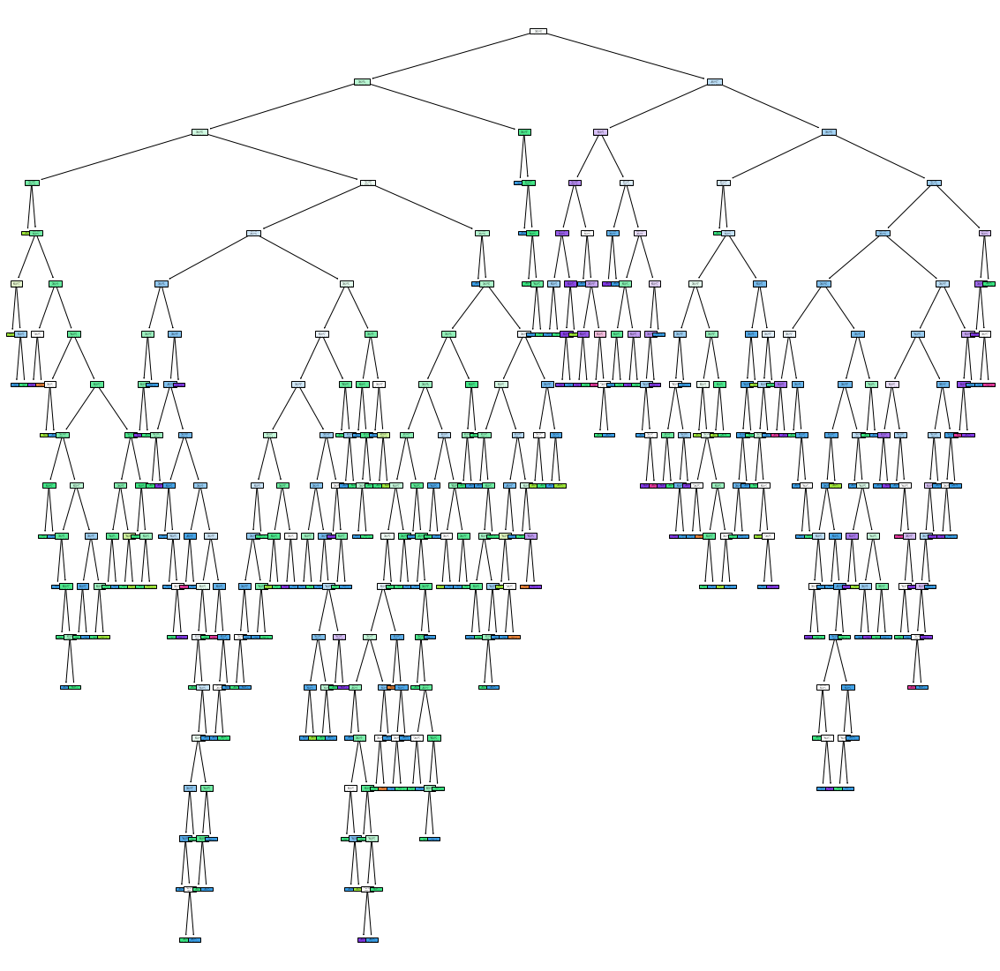

In [25]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [26]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [77]:
df1=df.head(50)

In [78]:
x1 = df1.drop(columns='quality')

In [79]:
y1 = df1.quality

In [80]:
dt_model1= DecisionTreeClassifier()

In [81]:
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

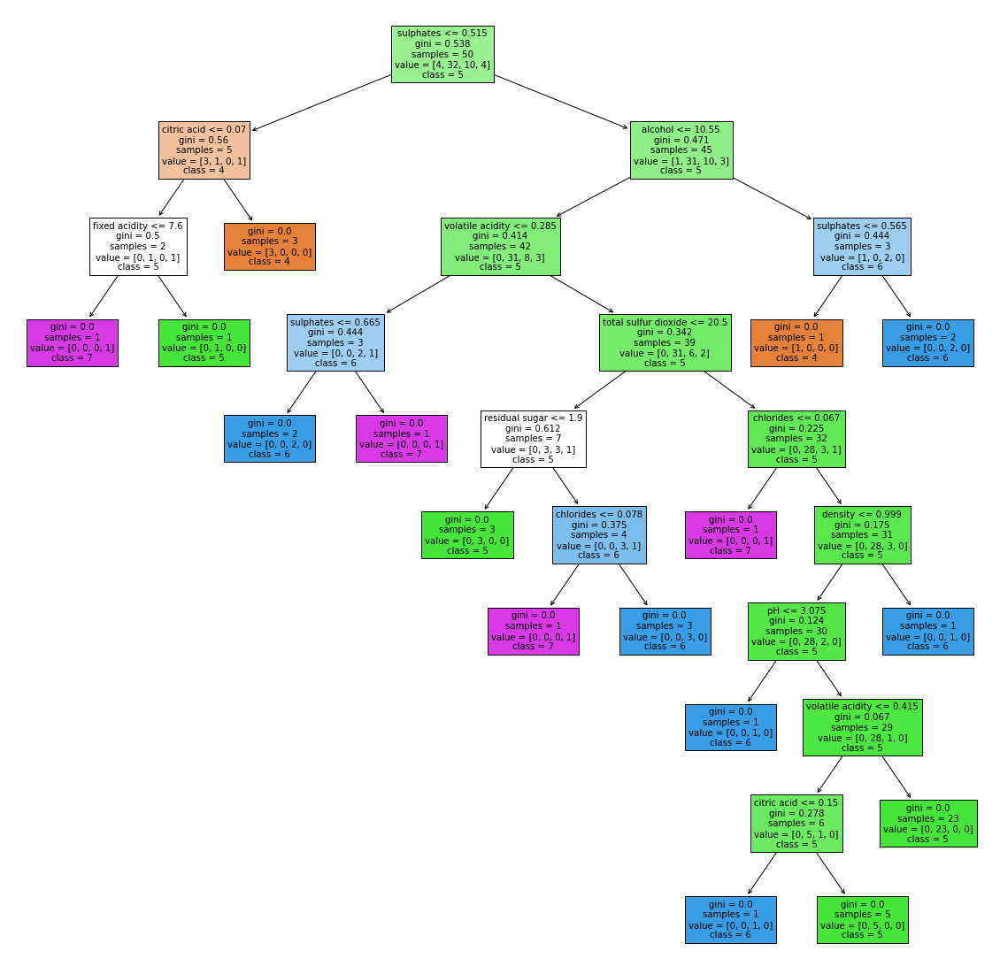

In [82]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)
plt.savefig('dt_model_1')

In [83]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [84]:
y1

0     5
1     5
2     5
3     6
4     5
5     5
6     5
7     7
8     7
9     5
10    5
11    5
12    5
13    5
14    5
15    5
16    7
17    5
18    4
19    6
20    6
21    5
22    5
23    5
24    6
25    5
26    5
27    5
28    5
29    6
30    5
31    6
32    5
33    6
34    5
35    6
36    6
37    7
38    4
39    5
40    5
41    4
42    6
43    5
44    5
45    4
46    5
47    5
48    5
49    5
Name: quality, dtype: int64

In [85]:
[str(i) for i in set(y1)]

['4', '5', '6', '7']

In [86]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [87]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5])

In [88]:
dt_model1.score(x_test,y_test)

0.4265625

In [89]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas

In [90]:
ccp_alpha

array([0.        , 0.01931034, 0.02      , 0.02666667, 0.02666667,
       0.03      , 0.0348832 , 0.0353629 , 0.036     , 0.04645833,
       0.052     , 0.0576    ])

In [91]:
dt_modle2 = []
for ccp in ccp_alpha:
    dt_m  = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_modle2.append(dt_m)

Text(0, 0.5, 'score')

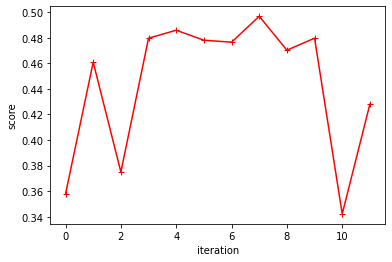

In [92]:
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))

    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [93]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.01931034482758619),
 DecisionTreeClassifier(ccp_alpha=0.02),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.03),
 DecisionTreeClassifier(ccp_alpha=0.03488320355951059),
 DecisionTreeClassifier(ccp_alpha=0.03536290322580643),
 DecisionTreeClassifier(ccp_alpha=0.036000000000000004),
 DecisionTreeClassifier(ccp_alpha=0.04645833333333334),
 DecisionTreeClassifier(ccp_alpha=0.05200000000000002),
 DecisionTreeClassifier(ccp_alpha=0.05760000000000004)]

In [94]:
train_score = [i.score(x1,y1) for i in dt_modle2]

In [95]:
test_score = [i.score(x_test ,y_test) for i in dt_modle2]

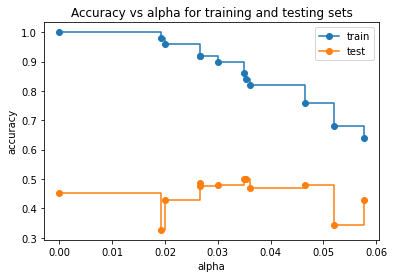

In [96]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [97]:
dt_model_ccp = DecisionTreeClassifier(random_state=0 , ccp_alpha=.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.44166666666666665, 0.95, 'X[9] <= 0.515\ngini = 0.538\nsamples = 50\nvalue = [4, 32, 10, 4]'),
 Text(0.2, 0.85, 'X[9] <= 0.475\ngini = 0.56\nsamples = 5\nvalue = [3, 1, 0, 1]'),
 Text(0.13333333333333333, 0.75, 'X[10] <= 9.7\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 0, 1]'),
 Text(0.06666666666666667, 0.65, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.2, 0.65, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.26666666666666666, 0.75, 'gini = 0.0\nsamples = 3\nvalue = [3, 0, 0, 0]'),
 Text(0.6833333333333333, 0.85, 'X[10] <= 10.55\ngini = 0.471\nsamples = 45\nvalue = [1, 31, 10, 3]'),
 Text(0.5, 0.75, 'X[1] <= 0.285\ngini = 0.414\nsamples = 42\nvalue = [0, 31, 8, 3]'),
 Text(0.3333333333333333, 0.65, 'X[6] <= 81.5\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1]'),
 Text(0.26666666666666666, 0.55, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 2, 0]'),
 Text(0.4, 0.55, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.6666666666666666, 0.65, 'X[6] <= 20.5\n

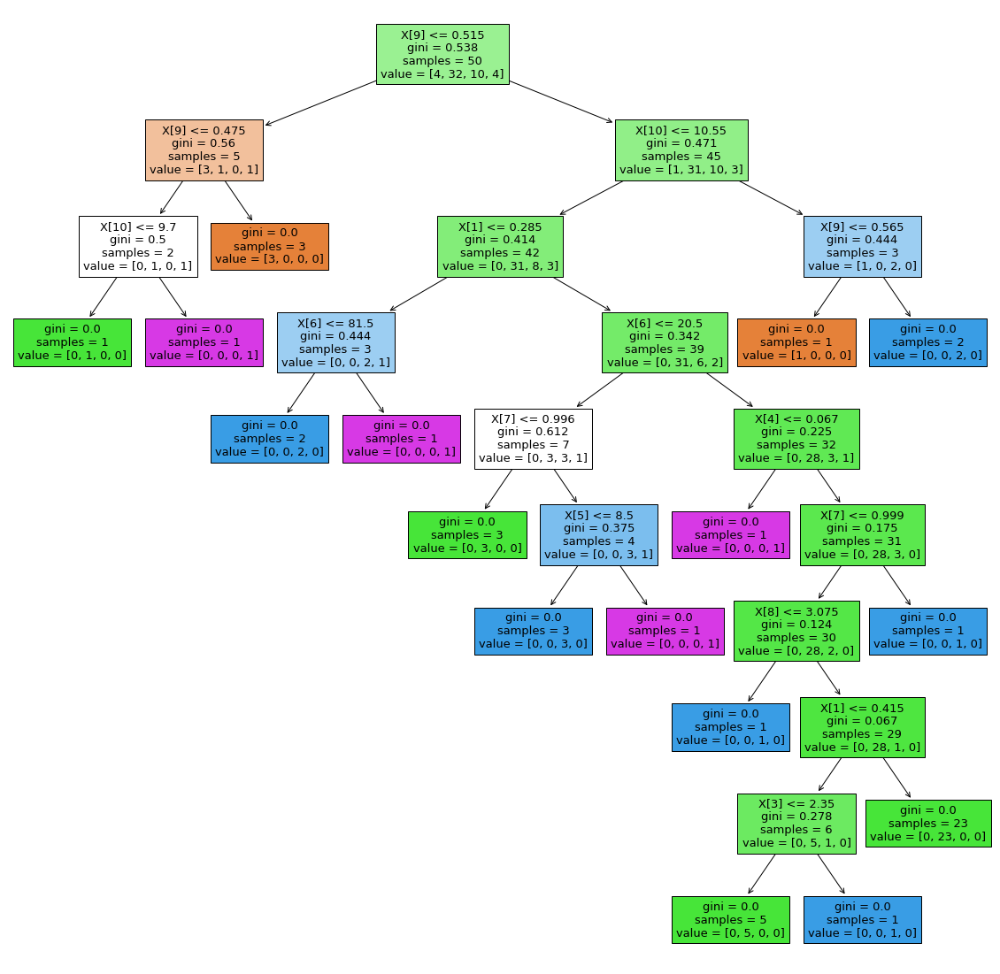

In [98]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [99]:
dt_model_ccp.score(x1,y1)

1.0

In [100]:
dt_model_ccp.score(x_test,y_test)

0.4546875

In [101]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [102]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20)
             }

In [103]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram , cv = 10 , n_jobs=-1)

In [104]:
grid_ccp.fit(x1,y1)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  UserWarning,


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.06523744, 0.81464458, 0.78725513, 0.3175606 , 0.84239007,
       0.01175803, 0.79233613, 0.26679804, 0.40928113, 0.1782475 ,
       0.340077  , 0.63467216, 0.51372409, 0.56207076, 0.77876342,
       0.62321955, 0.92985325, 0.9981905 , 0.67324479, 0.5566735 ]),
                         'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [105]:
grid_ccp.best_params_

{'ccp_alpha': 0.06523743549099126,
 'criterion': 'entropy',
 'max_depth': 6,
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'splitter': 'random'}

In [106]:
dt_cpp_new = DecisionTreeClassifier(criterion='entropy' , max_depth=6 ,min_samples_leaf=1 , min_samples_split=3 , splitter='random',ccp_alpha=0.06523)

In [107]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.06523, criterion='entropy', max_depth=6,
                       min_samples_split=3, splitter='random')

In [108]:
dt_cpp_new.score(x1,y1)

0.82

In [109]:
dt_cpp_new.score(x_test,y_test)

0.45625

In [110]:
pred = dt_cpp_new.predict(x_train)

In [111]:
confusion_matrix(y_train,pred)

array([[  0,   1,   3,   3,   0,   0],
       [  0,   4,  16,   9,   1,   0],
       [  0,  29, 273,  85,  20,   0],
       [  0,  31, 207, 150,   4,   0],
       [  0,  15,  31,  61,   4,   0],
       [  0,   2,   2,   7,   1,   0]])